In [1]:
!pip install --upgrade --force-reinstall "git+https://github.com/nbukhanchenko/transtimegrad"
!pip install --upgrade --force-reinstall gluonts==0.14.3
!pip install --upgrade --force-reinstall seaborn==0.13.1
!pip install --upgrade --force-reinstall pandas==2.2.0
!pip install --upgrade --force-reinstall lightning==2.1.3
!pip install --upgrade --force-reinstall diffusers==0.25.1
!pip install --upgrade --force-reinstall torchvision==0.17.2
!pip install --upgrade --force-reinstall torch==2.2.2
!pip install --upgrade --force-reinstall numpy==1.23.5

  Cloning https://github.com/nbukhanchenko/transtimegrad to /tmp/pip-req-build-8v38dvnx
  Running command git clone --filter=blob:none --quiet https://github.com/nbukhanchenko/transtimegrad /tmp/pip-req-build-8v38dvnx
  Resolved https://github.com/nbukhanchenko/transtimegrad to commit 9b4eceb2f14e5d56098fc776a9247c5c460ea119
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.8/56.8 kB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.9/40.9 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.3/107.3 kB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 160.9/160.9 kB 10.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 37.6 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 54.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 61.8 MB/s eta 0:

In [32]:
%matplotlib inline

from copy import deepcopy
import pickle

from diffusers import (
    PNDMScheduler,
    DDIMScheduler,
    DDPMScheduler,
    DPMSolverMultistepScheduler,
    KDPM2DiscreteScheduler,
    DEISMultistepScheduler,
)
from gluonts.dataset.multivariate_grouper import MultivariateGrouper
from gluonts.dataset.repository.datasets import dataset_recipes, get_dataset
from gluonts.dataset.repository.datasets import get_dataset
from gluonts.evaluation.backtest import make_evaluation_predictions
from gluonts.evaluation import MultivariateEvaluator
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from tqdm import tqdm

from ttg.model.rnn_timegrad import TimeGradEstimator
from ttg.model.trans_timegrad import TransTimeGradEstimator
from ttg.dataset.repository.datasets import dataset_recipes

In [33]:
def get_max_shape(dataset):
    max_shape = (0, 0)
    for i in range(len(dataset)):
        max_shape = max(max_shape, dataset[i]["target"].shape)
    return max_shape

def prepare_dataset_with_missing_values(dataset, missing_rate, missing_type, missing_value):
    assert missing_type in ("random", "time-level", "series-level")
    
    dataset = deepcopy(dataset)
    height, width = get_max_shape(dataset["test"])
    mask = {
        "random": np.random.rand(height, width) < missing_rate,
        "time-level": np.repeat(np.random.rand(1, width) < missing_rate, height, axis=0),
        "series-level": np.repeat(np.random.rand(height, 1) < missing_rate, width, axis=1),
    }[missing_type]

    for i in range(len(dataset["test"])):
        height, width = dataset["test"][i]["target"].shape
        dataset["test"][i]["target"][mask[:height, :width]] = missing_value

    return dataset

def prepare_dataset_without_missing_values(dataset_with_missing_values, missing_value):
    dataset_without_missing_values = deepcopy(dataset_with_missing_values)
    
    if np.isnan(missing_value):
        for i in range(len(dataset_without_missing_values)):
            dataset = dataset_without_missing_values["test"][i]["target"]
            dataset[:, 0] = 0

            mask = np.isnan(dataset)
            idx = np.where(~mask, np.arange(mask.shape[1]), 0)
            np.maximum.accumulate(idx, axis=1, out=idx)
            dataset = dataset[np.arange(idx.shape[0])[:, None], idx]

            dataset_without_missing_values["test"][i]["target"] = dataset

    return dataset_without_missing_values

def plot(
    target,
    forecast,
    prediction_length,
    prediction_intervals=(50.0, 90.0),
    color="g",
    fname=None,
):
    label_prefix = ""
    rows = 4
    cols = 4
    fig, axs = plt.subplots(rows, cols, figsize=(24, 24))
    axx = axs.ravel()
    seq_len, target_dim = target.shape

    ps = [50.0] + [
        50.0 + f * c / 2.0 for c in prediction_intervals for f in [-1.0, +1.0]
    ]

    percentiles_sorted = sorted(set(ps))

    for dim in range(0, min(rows * cols, target_dim)):
        ax = axx[dim]

        target[-2 * prediction_length :][dim].plot(ax=ax)

        ps_data = [forecast.quantile(p / 100.0)[:, dim] for p in percentiles_sorted]
        i_p50 = len(percentiles_sorted) // 2

        p50_data = ps_data[i_p50]
        p50_series = pd.Series(data=p50_data, index=forecast.index)
        p50_series.plot(color=color, ls="-", label=f"{label_prefix}median", ax=ax)

        for i in range(len(percentiles_sorted) // 2):
            ptile = percentiles_sorted[i]
            alpha = (ptile / 100.0) ** 0.3
            ax.fill_between(
                forecast.index,
                ps_data[i],
                ps_data[-i - 1],
                facecolor=color,
                alpha=alpha,
                interpolate=True,
            )
            # Hack to create labels for the error intervals.
            # Doesn't actually plot anything, because we only pass a single data point
            pd.Series(data=p50_data[:1], index=forecast.index[:1]).plot(
                color=color,
                alpha=alpha,
                linewidth=10,
                label=f"{label_prefix}{100 - ptile * 2}%",
                ax=ax,
            )

    legend = ["observations", "median prediction"] + [
        f"{k}% prediction interval" for k in prediction_intervals
    ][::-1]
    axx[0].legend(legend, loc="upper left")

    if fname is not None:
        plt.savefig(fname, bbox_inches="tight", pad_inches=0.05)

def prepare_dataset(dataset_name):
    dataset = get_dataset(dataset_name, regenerate=False)

    train_grouper = MultivariateGrouper(
        max_target_dim=int(dataset.metadata.feat_static_cat[0].cardinality)
    )
    test_grouper = MultivariateGrouper(
        num_test_dates=int(len(dataset.test) / len(dataset.train)),
        max_target_dim=int(dataset.metadata.feat_static_cat[0].cardinality),
    )

    return {
        "train": train_grouper(dataset.train),
        "test": test_grouper(dataset.test),
        "metadata": dataset.metadata
    }

def prepare_predictor(dataset, mode, max_epochs, accelerator,
                      num_train_timesteps=100, beta_start=1e-4, beta_end=0.1, beta_schedule="linear",
                      context_length_coef=3, num_layers=2, hidden_size=64, lr=1e-3, weight_decay=1e-8, dropout_rate=0.1,
                      lags_seq=[1, 7, 14, 24, 168], num_inference_steps=99, batch_size=64, num_batches_per_epoch=100):
    model = {
        "rnn_timegrad": TimeGradEstimator,
        "trans_timegrad": TransTimeGradEstimator,
    }
    
    scheduler = DEISMultistepScheduler(
        num_train_timesteps=num_train_timesteps,
        beta_start=beta_start,
        beta_end=beta_end,
        beta_schedule=beta_schedule,
    )
    
    estimator = model[mode](
        freq=dataset["metadata"].freq,
        prediction_length=dataset["metadata"].prediction_length,
        input_size=int(dataset["metadata"].feat_static_cat[0].cardinality),
        scheduler=scheduler,
        context_length=context_length_coef*dataset["metadata"].prediction_length,
        num_layers=num_layers,
        hidden_size=hidden_size,
        lr=lr,
        weight_decay=weight_decay,
        dropout_rate=dropout_rate,
        scaling="mean",
        lags_seq=lags_seq,
        num_inference_steps=num_inference_steps,
        batch_size=batch_size,
        num_batches_per_epoch=num_batches_per_epoch,
        trainer_kwargs=dict(max_epochs=max_epochs, accelerator=accelerator, devices="1"),
    )

    return estimator.train(
        training_data=dataset["train"],
        # validation_data=dataset["test"],
        cache_data=True,
        shuffle_buffer_length=1024,
    )

def prepare_metrics(dataset, predictor, num_samples=100):
    evaluator = MultivariateEvaluator(
        quantiles=(np.arange(20) / 20.0)[1:], target_agg_funcs={"sum": np.sum}
    )

    forecast_it, ts_it = make_evaluation_predictions(
        dataset=dataset["test"], predictor=predictor, num_samples=num_samples
    )
    forecasts, targets = list(forecast_it), list(ts_it)
    agg_metric, _ = evaluator(targets, forecasts, num_series=len(dataset["test"]))

    return forecasts, targets, agg_metric

def prepare_statistics(dataset, forecasts, targets, agg_metric, frame=0):
    metrics = {
        "CRPS": "mean_wQuantileLoss",
        "ND": "ND",
        "NRMSE": "NRMSE",
        "MSE": "MSE"
    }

    for name in metrics:
        print(f"{name}: {round(agg_metric[metrics[name]], 4)}")
        print(f"{name + '-Sum'}: {round(agg_metric['m_sum_' + metrics[name]], 4)}")
        print("-" * 64)

    plot(
        target=targets[frame],
        forecast=forecasts[frame],
        prediction_length=dataset["metadata"].prediction_length,
    )
    plt.show()

def prepare_metrics_for_comparison(datasets, missing_value, missing_types, missing_rates):
    metrics = {key: {} for key in datasets.keys()}

    for dataset_name in datasets:
        metrics[dataset_name][missing_value] = {}
        for missing_type in missing_types:
            metrics[dataset_name][missing_value][missing_type] = {
                "CRPS-Sum": [],
                "NRMSE-Sum": []
            }
            for missing_rate in missing_rates:
                metrics[dataset_name][missing_value][missing_type]["CRPS-Sum"].append(
                    round(
                        datasets[dataset_name]["missing_data"][(
                            missing_value, missing_type, missing_rate
                        )]["agg_metric"]["m_sum_mean_wQuantileLoss"], 4
                    )
                )
                metrics[dataset_name][missing_value][missing_type]["NRMSE-Sum"].append(
                    round(
                        datasets[dataset_name]["missing_data"][(
                            missing_value, missing_type, missing_rate
                        )]["agg_metric"]["m_sum_NRMSE"], 4
                    )
                )

    return metrics

In [4]:
datasets = {
    "solar_nips": {},
    "electricity_nips": {},
    "exchange_rate_nips": {}
}

for dataset_name in datasets:
    dataset = prepare_dataset(dataset_name)
    predictor = prepare_predictor(
        dataset=dataset, mode="rnn_timegrad", max_epochs=40, accelerator="gpu",
        num_train_timesteps=100, beta_start=1e-4, beta_end=0.1, beta_schedule="linear",
        context_length_coef=1, num_layers=3, hidden_size=40, lr=1e-3, weight_decay=1e-8, dropout_rate=0.1,
        lags_seq=[1, 7, 14, 24, 168], num_inference_steps=99, batch_size=64, num_batches_per_epoch=100)
    forecasts, targets, agg_metric = prepare_metrics(dataset, predictor)
    datasets[dataset_name] = {
        "dataset": dataset,
        "predictor": predictor,
        "forecasts": forecasts,
        "targets": targets,
        "agg_metric": agg_metric,
        "missing_data": {}
    }

/opt/conda/lib/python3.10/site-packages/gluonts/dataset/common.py:262: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.

  return pd.Period(val, freq)

/opt/conda/lib/python3.10/site-packages/gluonts/time_feature/_base.py:243: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.

  offset = to_offset(freq_str)

/opt/conda/lib/python3.10/site-packages/lightning/pytorch/trainer/configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.


2024-05-23 11:43:37.394055: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered

2024-05-23 11:43:37.394185: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been re

Training: |          | 0/? [00:00<?, ?it/s]

Running evaluation: 7it [00:00, 69.64it/s]

Running evaluation: 7it [00:00, 85.86it/s]

Running evaluation: 7it [00:00, 87.40it/s]

Running evaluation: 7it [00:00, 87.55it/s]

Running evaluation: 7it [00:00, 89.67it/s]

Running evaluation: 7it [00:00, 88.76it/s]

Running evaluation: 7it [00:00, 88.67it/s]

Running evaluation: 7it [00:00, 88.68it/s]

Running evaluation: 7it [00:00, 89.16it/s]

Running evaluation: 7it [00:00, 84.15it/s]

Running evaluation: 7it [00:00, 90.59it/s]

Running evaluation: 7it [00:00, 88.67it/s]

Running evaluation: 7it [00:00, 90.88it/s]

Running evaluation: 7it [00:00, 87.33it/s]

Running evaluation: 7it [00:00, 87.01it/s]

Running evaluation: 7it [00:00, 91.13it/s]

Running evaluation: 7it [00:00, 89.71it/s]

Running evaluation: 7it [00:00, 91.46it/s]

Running evaluation: 7it [00:00, 87.87it/s]

Running evaluation: 7it [00:00, 87.52it/s]

Running evaluation: 7it [00:00, 87.14it/s]

Running evaluation: 7it [00:00, 90.93it/s]

Running evaluation: 7it [00:00, 

Training: |          | 0/? [00:00<?, ?it/s]

Running evaluation: 7it [00:00, 91.05it/s]

Running evaluation: 7it [00:00, 91.13it/s]

Running evaluation: 7it [00:00, 90.51it/s]

Running evaluation: 7it [00:00, 91.89it/s]

Running evaluation: 7it [00:00, 90.29it/s]

Running evaluation: 7it [00:00, 92.50it/s]

Running evaluation: 7it [00:00, 88.94it/s]

Running evaluation: 7it [00:00, 91.07it/s]

Running evaluation: 7it [00:00, 89.49it/s]

Running evaluation: 7it [00:00, 92.66it/s]

Running evaluation: 7it [00:00, 91.40it/s]

Running evaluation: 7it [00:00, 91.80it/s]

Running evaluation: 7it [00:00, 92.85it/s]

Running evaluation: 7it [00:00, 90.20it/s]

Running evaluation: 7it [00:00, 90.18it/s]

Running evaluation: 7it [00:00, 89.30it/s]

Running evaluation: 7it [00:00, 90.28it/s]

Running evaluation: 7it [00:00, 90.07it/s]

Running evaluation: 7it [00:00, 91.47it/s]

Running evaluation: 7it [00:00, 89.24it/s]

Running evaluation: 7it [00:00, 90.61it/s]

Running evaluation: 7it [00:00, 90.21it/s]

Running evaluation: 7it [00:00, 

Training: |          | 0/? [00:00<?, ?it/s]

/opt/conda/lib/python3.10/site-packages/gluonts/dataset/split.py:181: FutureWarning: Period with BDay freq is deprecated and will be removed in a future version. Use a DatetimeIndex with BDay freq instead.

  sliced_entry[FieldName.START] += offset

/opt/conda/lib/python3.10/site-packages/gluonts/transform/feature.py:364: FutureWarning: Period with BDay freq is deprecated and will be removed in a future version. Use a DatetimeIndex with BDay freq instead.

  index = pd.period_range(start, periods=length, freq=start.freq)

/opt/conda/lib/python3.10/site-packages/gluonts/transform/feature.py:364: FutureWarning: PeriodDtype[B] is deprecated and will be removed in a future version. Use a DatetimeIndex with freq='B' instead

  index = pd.period_range(start, periods=length, freq=start.freq)

/opt/conda/lib/python3.10/site-packages/gluonts/transform/split.py:150: FutureWarning: Period with BDay freq is deprecated and will be removed in a future version. Use a DatetimeIndex with BDay freq inst

CRPS: 0.3675

CRPS-Sum: 0.3375

----------------------------------------------------------------

ND: 0.4545

ND-Sum: 0.3715

----------------------------------------------------------------

NRMSE: 0.9142

NRMSE-Sum: 0.6699

----------------------------------------------------------------

MSE: 792.8248

MSE-Sum: 7990089.2857

----------------------------------------------------------------


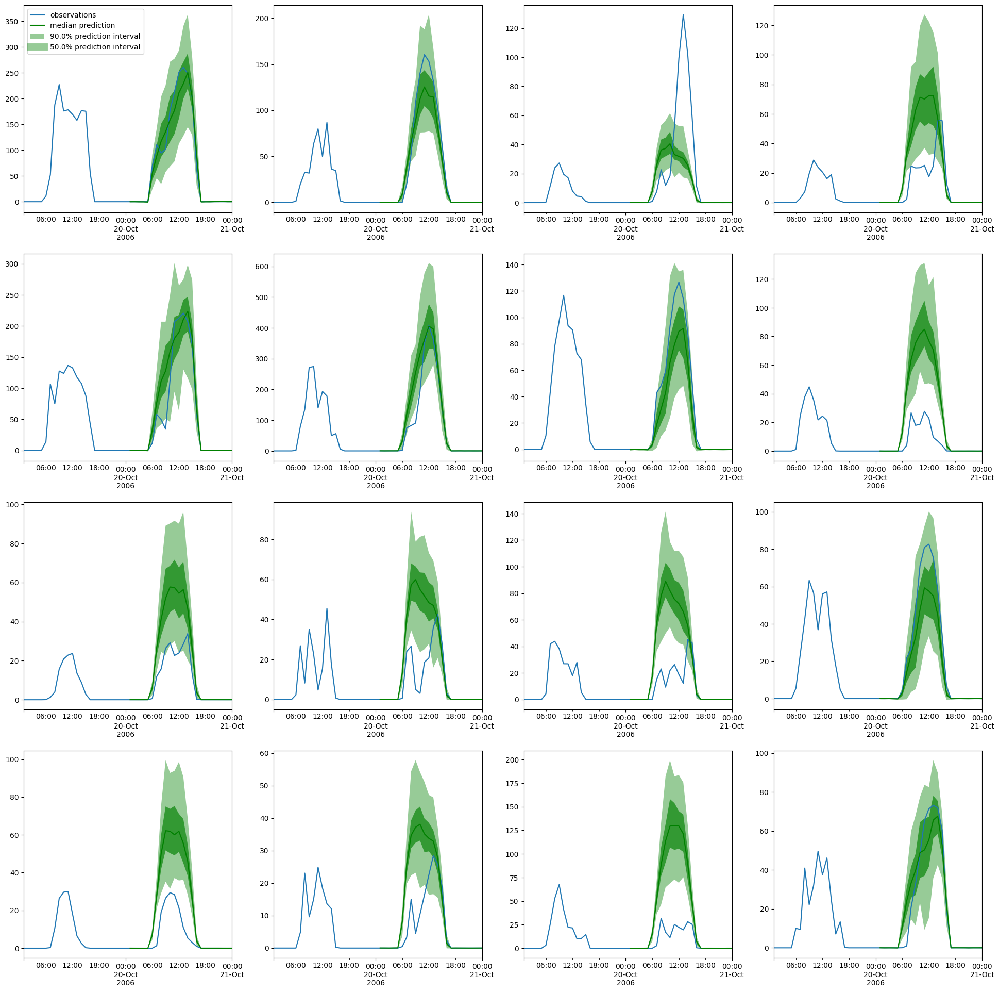

In [11]:
prepare_statistics(
    datasets["solar_nips"]["dataset"], datasets["solar_nips"]["forecasts"],
    datasets["solar_nips"]["targets"], datasets["solar_nips"]["agg_metric"]
)

CRPS: 0.055

CRPS-Sum: 0.0232

----------------------------------------------------------------

ND: 0.0692

ND-Sum: 0.03

----------------------------------------------------------------

NRMSE: 0.6004

NRMSE-Sum: 0.0413

----------------------------------------------------------------

MSE: 206458.7031

MSE-Sum: 133611718.0952

----------------------------------------------------------------


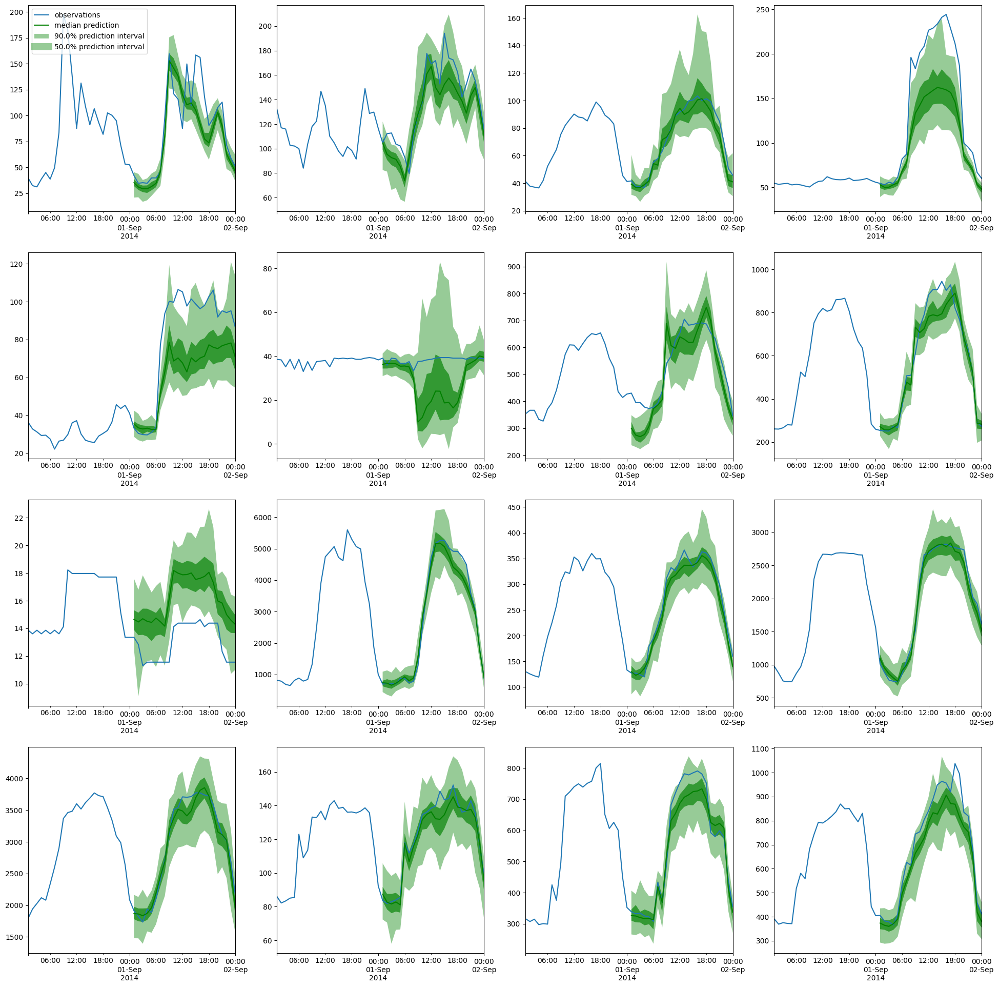

In [12]:
prepare_statistics(
    datasets["electricity_nips"]["dataset"], datasets["electricity_nips"]["forecasts"],
    datasets["electricity_nips"]["targets"], datasets["electricity_nips"]["agg_metric"]
)

CRPS: 0.0156

CRPS-Sum: 0.0155

----------------------------------------------------------------

ND: 0.0216

ND-Sum: 0.0211

----------------------------------------------------------------

NRMSE: 0.0318

NRMSE-Sum: 0.023

----------------------------------------------------------------

MSE: 0.0007

MSE-Sum: 0.0225

----------------------------------------------------------------


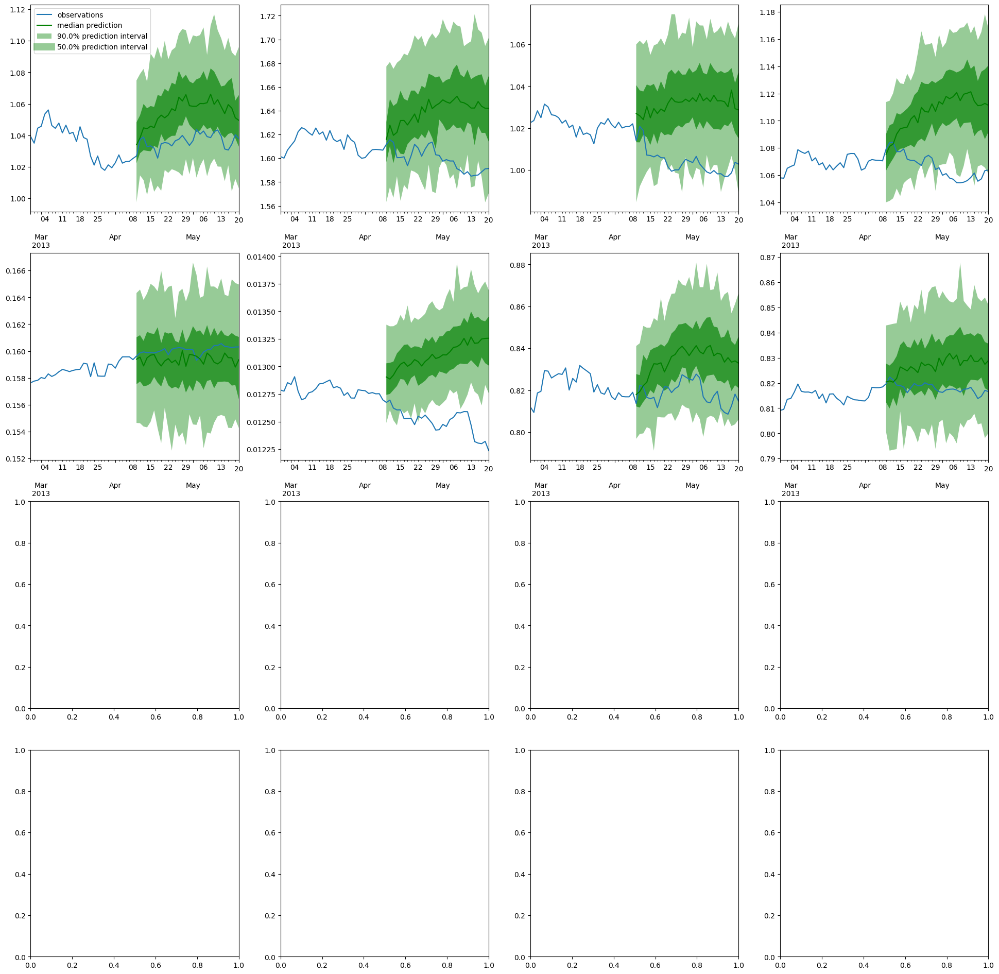

In [13]:
prepare_statistics(
    datasets["exchange_rate_nips"]["dataset"], datasets["exchange_rate_nips"]["forecasts"],
    datasets["exchange_rate_nips"]["targets"], datasets["exchange_rate_nips"]["agg_metric"]
)

In [8]:
with open("rnn.pkl", "wb") as data:
    pickle.dump(datasets, data)

In [35]:
datasets = {
    "solar_nips": {},
    "electricity_nips": {},
    "exchange_rate_nips": {}
}

for dataset_name in datasets:
    dataset = prepare_dataset(dataset_name)
    predictor = prepare_predictor(
        dataset=dataset, mode="trans_timegrad", max_epochs=200, accelerator="gpu",
        num_train_timesteps=150, beta_start=1e-4, beta_end=0.1, beta_schedule="linear",
        context_length_coef=3, num_layers=2, hidden_size=64, lr=5e-4, weight_decay=1e-8, dropout_rate=0.1,
        lags_seq=[1, 7, 24], num_inference_steps=149, batch_size=32, num_batches_per_epoch=50)
    forecasts, targets, agg_metric = prepare_metrics(dataset, predictor)
    datasets[dataset_name] = {
        "dataset": dataset,
        "predictor": predictor,
        "forecasts": forecasts,
        "targets": targets,
        "agg_metric": agg_metric,
        "missing_data": {}
    }

/opt/conda/lib/python3.10/site-packages/gluonts/time_feature/_base.py:243: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset = to_offset(freq_str)
/opt/conda/lib/python3.10/site-packages/torch/nn/modules/transformer.py:286: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
/opt/conda/lib/python3.10/site-packages/lightning/pytorch/trainer/configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name  | Type               | Params | In sizes                                                             | Out sizes        
---------------------------------------------------------------------------------------------------------------

Training: |          | 0/? [00:00<?, ?it/s]

/opt/conda/lib/python3.10/site-packages/torch/nn/modules/transformer.py:286: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")

Running evaluation: 7it [00:00, 58.21it/s]

Running evaluation: 7it [00:00, 72.01it/s]

Running evaluation: 7it [00:00, 72.86it/s]

Running evaluation: 7it [00:00, 79.50it/s]

Running evaluation: 7it [00:00, 68.22it/s]

Running evaluation: 7it [00:00, 79.48it/s]

Running evaluation: 7it [00:00, 81.90it/s]

Running evaluation: 7it [00:00, 72.42it/s]

Running evaluation: 7it [00:00, 71.24it/s]

Running evaluation: 7it [00:00, 67.61it/s]

Running evaluation: 7it [00:00, 77.13it/s]

Running evaluation: 7it [00:00, 82.72it/s]

Running evaluation: 7it [00:00, 81.11it/s]

Running evaluation: 7it [00:00, 81.23it/s]

Running evaluation: 7it [00:00, 83.15it/s]

Running evaluation

Training: |          | 0/? [00:00<?, ?it/s]

/opt/conda/lib/python3.10/site-packages/torch/nn/modules/transformer.py:286: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")

Running evaluation: 7it [00:00, 76.37it/s]

Running evaluation: 7it [00:00, 77.19it/s]

Running evaluation: 7it [00:00, 76.91it/s]

Running evaluation: 7it [00:00, 74.03it/s]

Running evaluation: 7it [00:00, 79.22it/s]

Running evaluation: 7it [00:00, 76.14it/s]

Running evaluation: 7it [00:00, 76.20it/s]

Running evaluation: 7it [00:00, 78.01it/s]

Running evaluation: 7it [00:00, 72.12it/s]

Running evaluation: 7it [00:00, 73.60it/s]

Running evaluation: 7it [00:00, 74.14it/s]

Running evaluation: 7it [00:00, 73.44it/s]

Running evaluation: 7it [00:00, 73.90it/s]

Running evaluation: 7it [00:00, 73.93it/s]

Running evaluation: 7it [00:00, 72.72it/s]

Running evaluation

Training: |          | 0/? [00:00<?, ?it/s]

/opt/conda/lib/python3.10/site-packages/torch/nn/modules/transformer.py:286: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
/opt/conda/lib/python3.10/site-packages/gluonts/dataset/split.py:181: FutureWarning: Period with BDay freq is deprecated and will be removed in a future version. Use a DatetimeIndex with BDay freq instead.
  sliced_entry[FieldName.START] += offset
/opt/conda/lib/python3.10/site-packages/gluonts/transform/feature.py:364: FutureWarning: Period with BDay freq is deprecated and will be removed in a future version. Use a DatetimeIndex with BDay freq instead.
  index = pd.period_range(start, periods=length, freq=start.freq)
/opt/conda/lib/python3.10/site-packages/gluonts/transform/feature.py:364: FutureWarning: PeriodDtype[B] is deprecated and will be removed in a future versi

CRPS: 0.3589
CRPS-Sum: 0.317
----------------------------------------------------------------
ND: 0.4335
ND-Sum: 0.3572
----------------------------------------------------------------
NRMSE: 0.9408
NRMSE-Sum: 0.6971
----------------------------------------------------------------
MSE: 839.6088
MSE-Sum: 8650848.2683
----------------------------------------------------------------


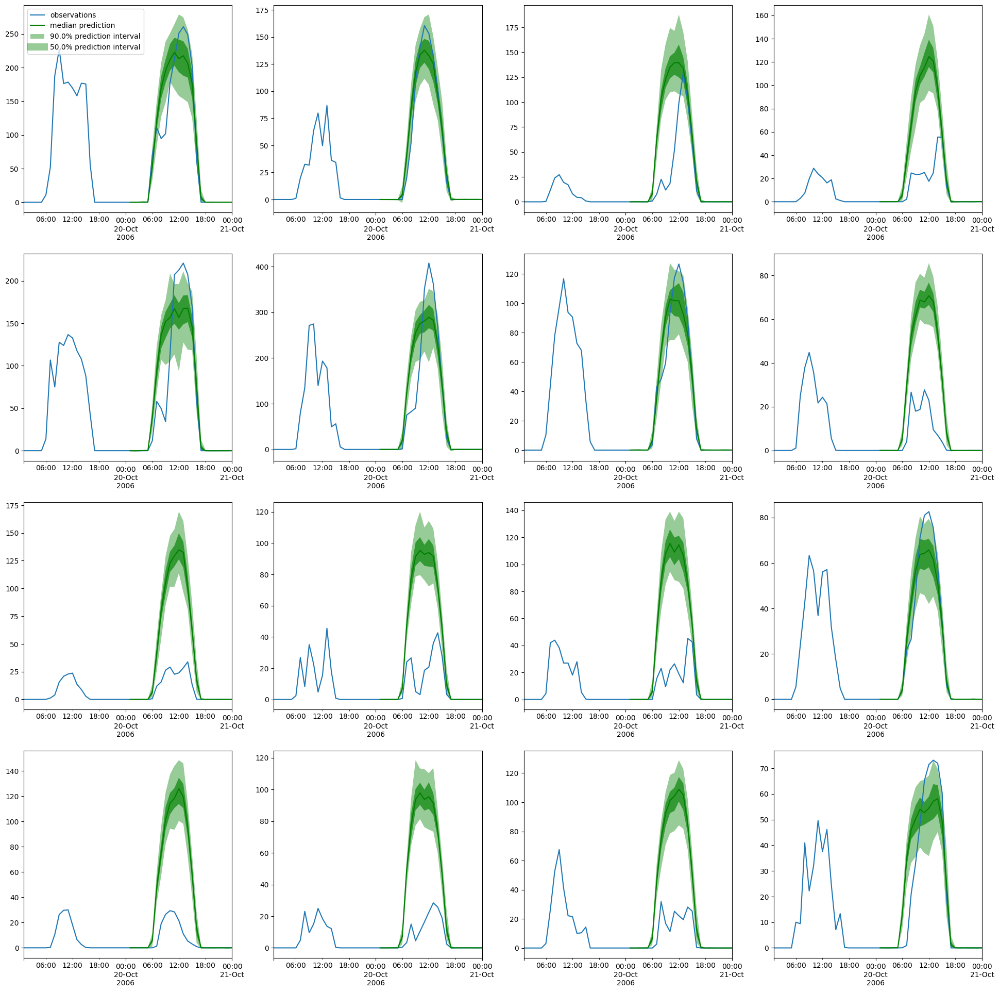

In [36]:
prepare_statistics(
    datasets["solar_nips"]["dataset"], datasets["solar_nips"]["forecasts"],
    datasets["solar_nips"]["targets"], datasets["solar_nips"]["agg_metric"]
)

CRPS: 0.0551
CRPS-Sum: 0.0243
----------------------------------------------------------------
ND: 0.071
ND-Sum: 0.0332
----------------------------------------------------------------
NRMSE: 0.796
NRMSE-Sum: 0.0501
----------------------------------------------------------------
MSE: 362947.3408
MSE-Sum: 196748170.6602
----------------------------------------------------------------


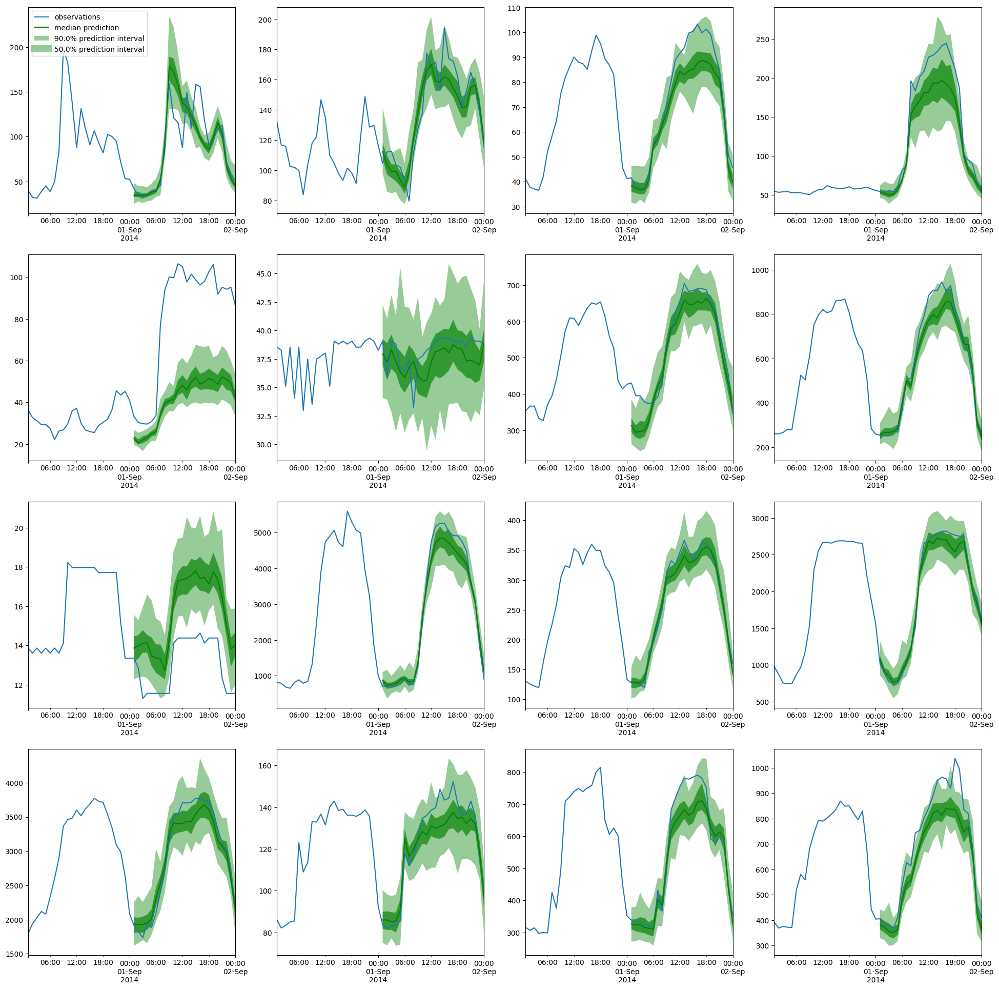

In [37]:
prepare_statistics(
    datasets["electricity_nips"]["dataset"], datasets["electricity_nips"]["forecasts"],
    datasets["electricity_nips"]["targets"], datasets["electricity_nips"]["agg_metric"]
)

CRPS: 0.0118
CRPS-Sum: 0.007
----------------------------------------------------------------
ND: 0.0156
ND-Sum: 0.0088
----------------------------------------------------------------
NRMSE: 0.0248
NRMSE-Sum: 0.0127
----------------------------------------------------------------
MSE: 0.0004
MSE-Sum: 0.0068
----------------------------------------------------------------


/opt/conda/lib/python3.10/site-packages/gluonts/model/forecast.py:365: FutureWarning: Period with BDay freq is deprecated and will be removed in a future version. Use a DatetimeIndex with BDay freq instead.
  self._index = pd.period_range(
/opt/conda/lib/python3.10/site-packages/gluonts/model/forecast.py:365: FutureWarning: PeriodDtype[B] is deprecated and will be removed in a future version. Use a DatetimeIndex with freq='B' instead
  self._index = pd.period_range(


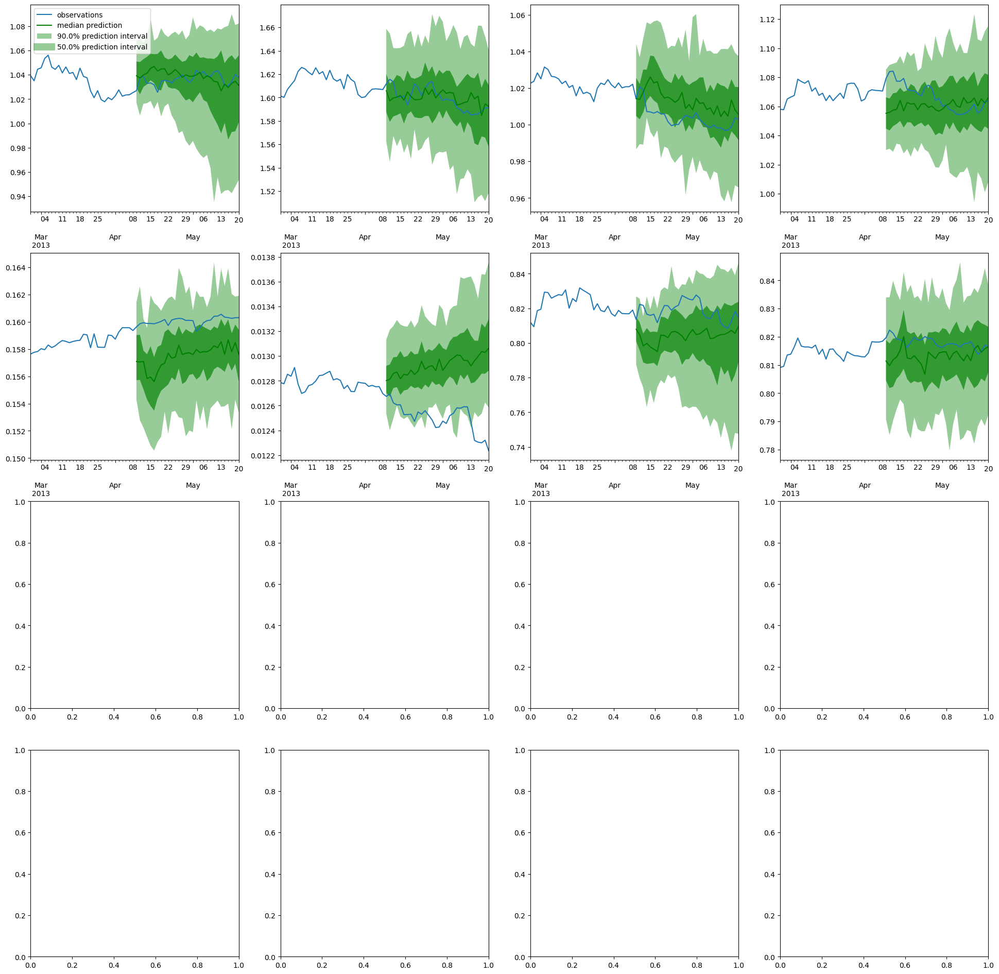

In [38]:
prepare_statistics(
    datasets["exchange_rate_nips"]["dataset"], datasets["exchange_rate_nips"]["forecasts"],
    datasets["exchange_rate_nips"]["targets"], datasets["exchange_rate_nips"]["agg_metric"]
)

In [40]:
num_samples = 100
missing_value = np.nan
missing_types = ["random", "time-level", "series-level"]
missing_rates = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

for dataset_name in datasets:
    for missing_type in missing_types:
        for missing_rate in tqdm(missing_rates):
            dataset = datasets[dataset_name]["dataset"]
            predictor = datasets[dataset_name]["predictor"]
            targets = datasets[dataset_name]["targets"]

            dataset_with_missing_values = prepare_dataset_with_missing_values(
                dataset=dataset,
                missing_rate=missing_rate,
                missing_type=missing_type,
                missing_value=missing_value
            )
            dataset_without_missing_values = prepare_dataset_without_missing_values(
                dataset_with_missing_values=dataset_with_missing_values,
                missing_value=missing_value
            )
            evaluator = MultivariateEvaluator(
                quantiles=(np.arange(20) / 20.0)[1:], target_agg_funcs={"sum": np.sum}
            )
            forecast_it, _ = make_evaluation_predictions(
                dataset=dataset_without_missing_values["test"],
                predictor=predictor,
                num_samples=num_samples
            )
            forecasts = list(forecast_it)
            agg_metric, _ = evaluator(
                targets, forecasts, num_series=len(dataset_without_missing_values["test"])
            )


            datasets[dataset_name]["missing_data"][(
                missing_value, missing_type, missing_rate
            )] = {
                "dataset_with_missing_values": dataset_with_missing_values,
                "dataset_without_missing_values": dataset_without_missing_values,
                "forecasts": forecasts,
                "agg_metric": agg_metric
            }


  0%|          | 0/9 [00:00<?, ?it/s]

Running evaluation: 7it [00:00, 77.30it/s][A


Running evaluation: 7it [00:00, 76.42it/s][A


Running evaluation: 7it [00:00, 75.53it/s][A


Running evaluation: 7it [00:00, 73.32it/s][A


Running evaluation: 7it [00:00, 73.07it/s][A


Running evaluation: 7it [00:00, 74.01it/s][A


Running evaluation: 7it [00:00, 77.46it/s][A


Running evaluation: 7it [00:00, 71.86it/s][A


Running evaluation: 7it [00:00, 73.92it/s][A


Running evaluation: 7it [00:00, 75.01it/s][A


Running evaluation: 7it [00:00, 77.12it/s][A


Running evaluation: 7it [00:00, 80.14it/s][A


Running evaluation: 7it [00:00, 83.11it/s][A


Running evaluation: 7it [00:00, 72.18it/s][A


Running evaluation: 7it [00:00, 77.49it/s][A


Running evaluation: 7it [00:00, 80.02it/s][A


Running evaluation: 7it [00:00, 80.35it/s][A


Running evaluation: 7it [00:00, 79.67it/s][A


Running evaluation: 7it [00:00, 76.26it/s][A


Running evaluation: 7it [00:00, 76.78it/s][A


Running evaluation: 

In [41]:
metrics = prepare_metrics_for_comparison(datasets, missing_value, missing_types, missing_rates)

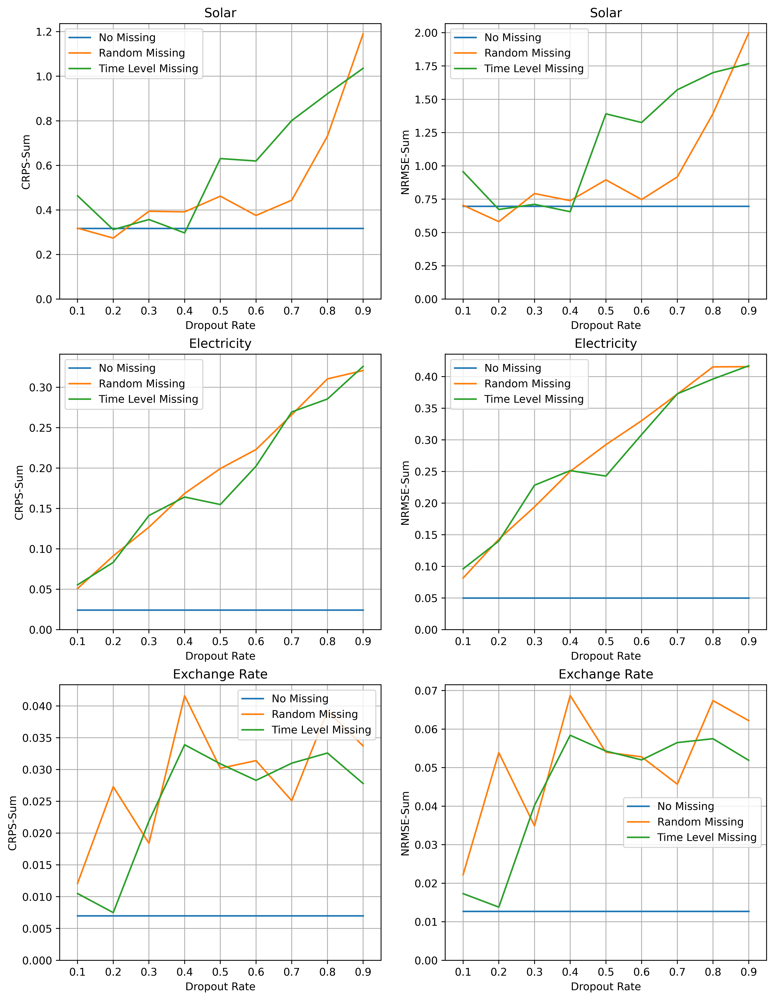

In [43]:
titles = {
    "solar_nips": "Solar",
    "electricity_nips": "Electricity",
    "exchange_rate_nips": "Exchange Rate"
}
scores = {
    "CRPS-Sum": "m_sum_mean_wQuantileLoss",
    "NRMSE-Sum": "m_sum_NRMSE"
}
fig, axs = plt.subplots(3, 2, figsize=(12, 16), dpi=512)

for i, dataset_name in enumerate(["solar_nips", "electricity_nips", "exchange_rate_nips"]):
    for j, metric_name in enumerate(["CRPS-Sum", "NRMSE-Sum"]):
        no_missing_forecast_score = [
            round(datasets[dataset_name]["agg_metric"][scores[metric_name]], 4) for _ in missing_rates
        ]
        axs[i, j].plot(missing_rates, no_missing_forecast_score, label="No Missing")
        axs[i, j].plot(missing_rates, metrics[dataset_name][missing_value]["random"][metric_name], label="Random Missing")
        axs[i, j].plot(missing_rates, metrics[dataset_name][missing_value]["time-level"][metric_name], label="Time Level Missing")
        # axs[i, j].plot(missing_rates, metrics[dataset_name][missing_value]["series-level"][metric_name], label="Series Level Missing")
        axs[i, j].set(xlabel="Dropout Rate", ylabel=metric_name)
        axs[i, j].set_title(titles[dataset_name])
        axs[i, j].axis(xmin=0.05, xmax=0.95, ymin=0.)
        axs[i, j].legend()
        axs[i, j].grid()

CRPS: 0.1093
CRPS-Sum: 0.0913
----------------------------------------------------------------
ND: 0.1354
ND-Sum: 0.1081
----------------------------------------------------------------
NRMSE: 1.3042
NRMSE-Sum: 0.1429
----------------------------------------------------------------
MSE: 974260.4405
MSE-Sum: 1600349715.6039
----------------------------------------------------------------


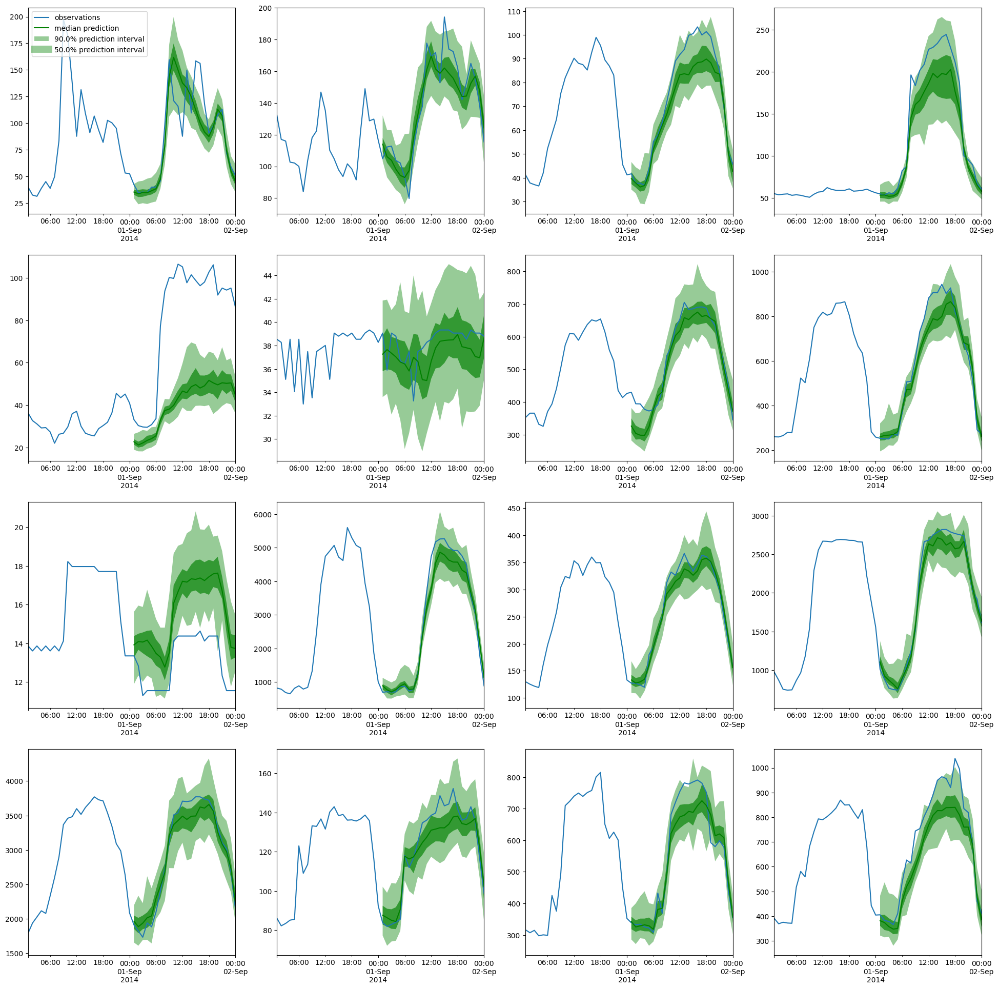

In [45]:
dataset_name = "electricity_nips"
missing_type = "random"
missing_rate = 0.2

prepare_statistics(
    datasets[dataset_name]["missing_data"][(missing_value, missing_type, missing_rate)]["dataset_without_missing_values"],
    datasets[dataset_name]["missing_data"][(missing_value, missing_type, missing_rate)]["forecasts"],
    datasets[dataset_name]["targets"],
    datasets[dataset_name]["missing_data"][(missing_value, missing_type, missing_rate)]["agg_metric"]
)

CRPS: 0.1832
CRPS-Sum: 0.1686
----------------------------------------------------------------
ND: 0.2134
ND-Sum: 0.1879
----------------------------------------------------------------
NRMSE: 2.2992
NRMSE-Sum: 0.2502
----------------------------------------------------------------
MSE: 3027762.8437
MSE-Sum: 4907958884.7651
----------------------------------------------------------------


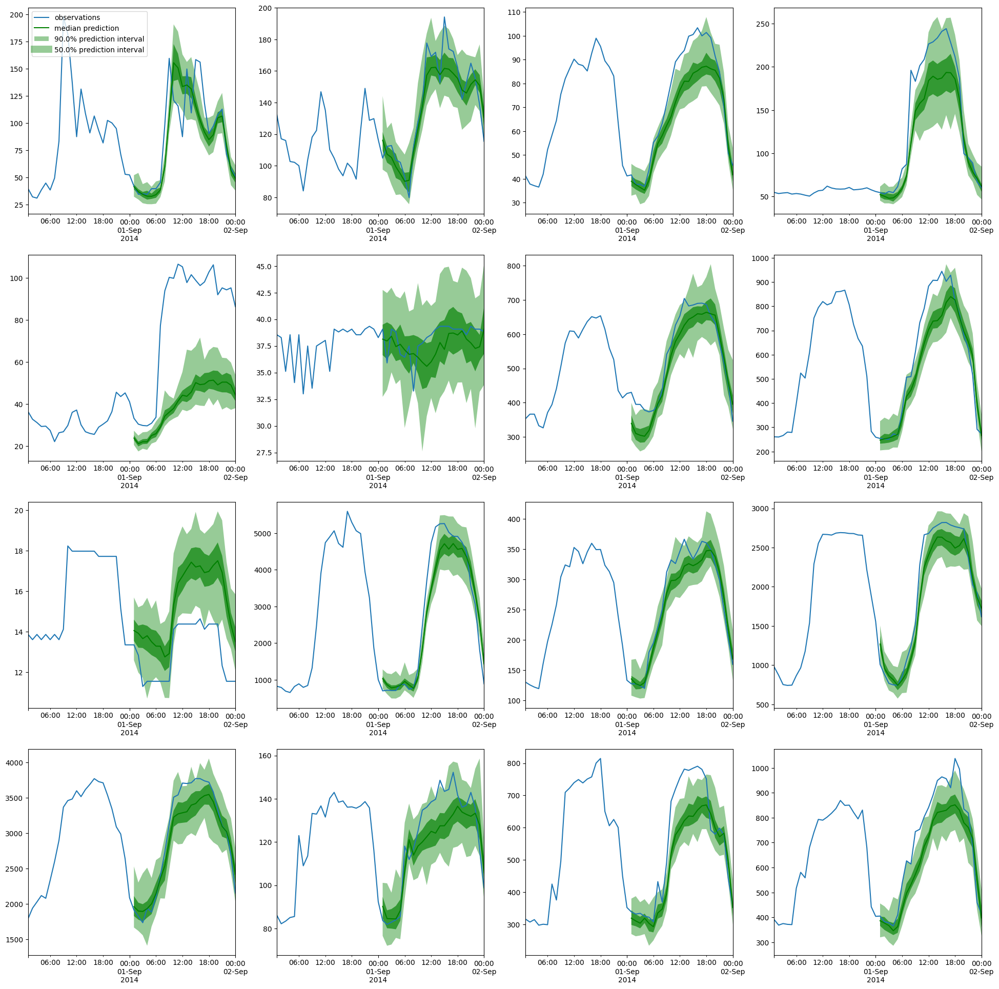

In [47]:
dataset_name = "electricity_nips"
missing_type = "random"
missing_rate = 0.4

prepare_statistics(
    datasets[dataset_name]["missing_data"][(missing_value, missing_type, missing_rate)]["dataset_without_missing_values"],
    datasets[dataset_name]["missing_data"][(missing_value, missing_type, missing_rate)]["forecasts"],
    datasets[dataset_name]["targets"],
    datasets[dataset_name]["missing_data"][(missing_value, missing_type, missing_rate)]["agg_metric"]
)

CRPS: 0.2477
CRPS-Sum: 0.223
----------------------------------------------------------------
ND: 0.282
ND-Sum: 0.2405
----------------------------------------------------------------
NRMSE: 2.9108
NRMSE-Sum: 0.3303
----------------------------------------------------------------
MSE: 4852814.5559
MSE-Sum: 8552727332.0169
----------------------------------------------------------------


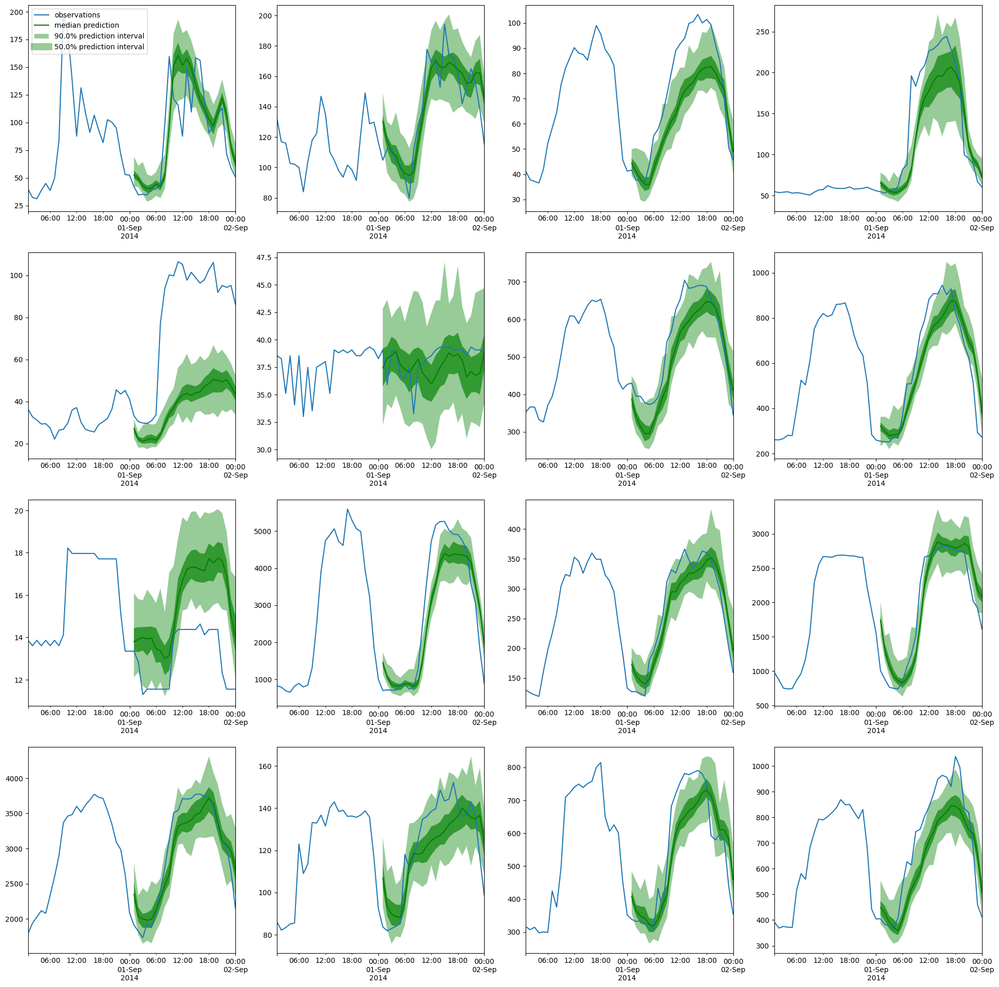

In [49]:
dataset_name = "electricity_nips"
missing_type = "random"
missing_rate = 0.6

prepare_statistics(
    datasets[dataset_name]["missing_data"][(missing_value, missing_type, missing_rate)]["dataset_without_missing_values"],
    datasets[dataset_name]["missing_data"][(missing_value, missing_type, missing_rate)]["forecasts"],
    datasets[dataset_name]["targets"],
    datasets[dataset_name]["missing_data"][(missing_value, missing_type, missing_rate)]["agg_metric"]
)

CRPS: 0.3335
CRPS-Sum: 0.3104
----------------------------------------------------------------
ND: 0.3706
ND-Sum: 0.3337
----------------------------------------------------------------
NRMSE: 3.756
NRMSE-Sum: 0.4154
----------------------------------------------------------------
MSE: 8080062.6861
MSE-Sum: 13530284597.1613
----------------------------------------------------------------


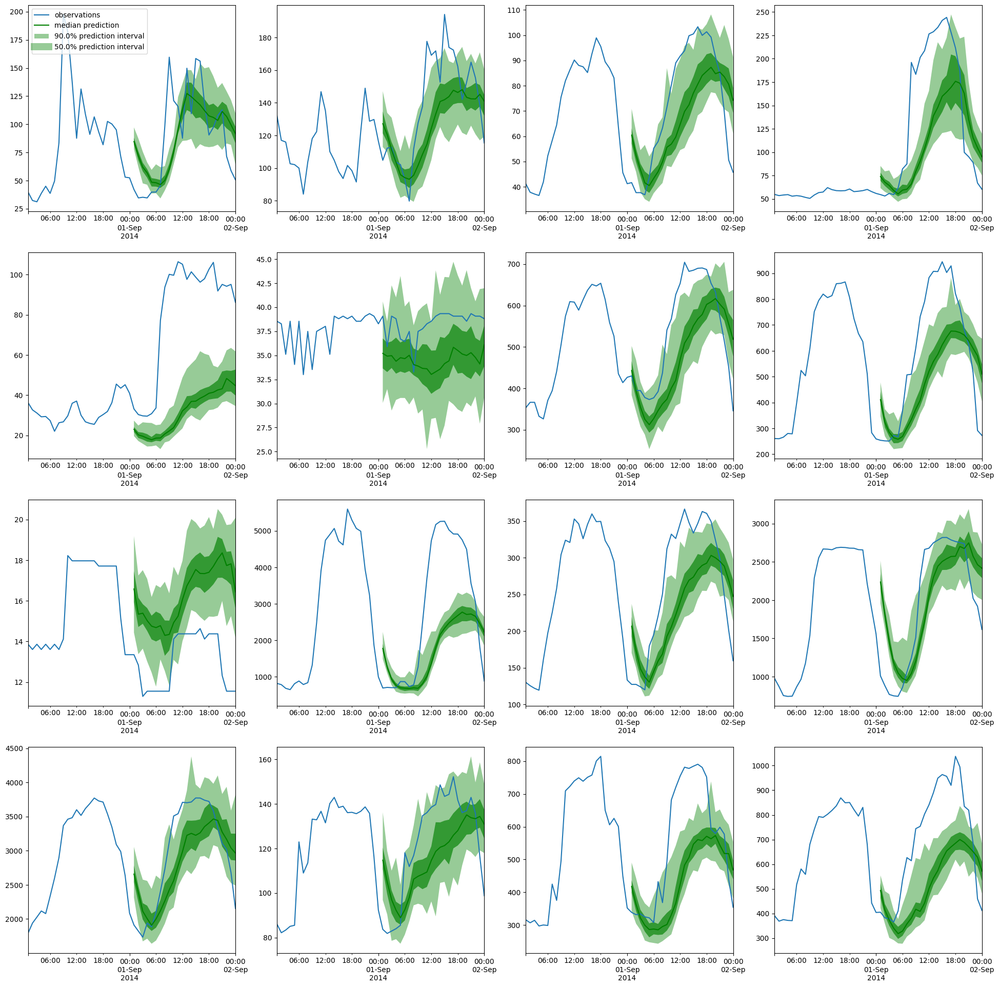

In [51]:
dataset_name = "electricity_nips"
missing_type = "random"
missing_rate = 0.8

prepare_statistics(
    datasets[dataset_name]["missing_data"][(missing_value, missing_type, missing_rate)]["dataset_without_missing_values"],
    datasets[dataset_name]["missing_data"][(missing_value, missing_type, missing_rate)]["forecasts"],
    datasets[dataset_name]["targets"],
    datasets[dataset_name]["missing_data"][(missing_value, missing_type, missing_rate)]["agg_metric"]
)

In [53]:
with open("trans.pkl", "wb") as data:
    pickle.dump(datasets, data)